In [1]:
import os
import sys
from tqdm import tqdm
from collections import defaultdict

import seaborn as sns
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from transformers import AutoTokenizer

from hf import decode_4d, decode_3d, format_prompts

## setup

In [8]:
# model_id = 'Mistral-7B-Instruct-v0.1'

# model_id_ = 'meta-llama/' + model_id if 'Llama' in model_id else 'mistralai/' + model_id
# tokenizer = AutoTokenizer.from_pretrained(model_id_, padding_side='left')

In [9]:
# Prompt templates
p_judge = """Q: Is the following sequence of coin flips generated by a random process with no pattern, or are they generated by a non-random algorithm? [{flips}]

A: The sequence was generated by a"""

source_coin = 'a weighted coin, with {}% probability of Heads and {}% probability of Tails'
source_fair = 'a fair coin, with 50% probability of Heads and 50% probability of Tails'
source_non = 'a non-random algorithmic process'

p_gen = """Q: Generate a sequence of 1000 random samples from {source}.

A: [{flips}"""

concepts = [
    (0, 1),
    (0, 1, 0),
    (0, 1, 1),
    (0, 1, 1, 0),
    (0, 1, 1, 1),
    (0, 0, 0, 0, 1),
    (0, 0, 1, 0, 1),
    (1, 0, 1, 0, 1),
    (1, 1, 1, 0, 0),
]

In [10]:
model_ids = [
    'mistralai/Mistral-7B-v0.1',
    'mistralai/Mistral-7B-Instruct-v0.1',
    'mistralai/Mixtral-8x7B-v0.1',
    'mistralai/Mixtral-8x7B-Instruct-v0.1',
    'meta-llama/Llama-2-7b-hf',
    'meta-llama/Llama-2-13b-hf',
    'meta-llama/Llama-2-70b-hf',
    'allenai/tulu-2-7b',
    'allenai/tulu-2-13b',
    'allenai/tulu-2-70b',
    'allenai/tulu-2-dpo-7b',
    'allenai/tulu-2-dpo-13b',
    'allenai/tulu-2-dpo-70b',
]

In [11]:
tokenizers = {model_id: AutoTokenizer.from_pretrained(model_id, padding_side='left', use_fast=False if 'tulu-2' in model_id else True)
              for model_id in model_ids}

You are using the default legacy behaviour of the <class 'transformers.models.llama.tokenization_llama.LlamaTokenizer'>. This is expected, and simply means that the `legacy` (previous) behavior will be used so nothing changes for you. If you want to use the new behaviour, set `legacy=False`. This should only be set if you understand what it means, and thoroughly read the reason why this was added as explained in https://github.com/huggingface/transformers/pull/24565


In [12]:
def load_mats(files_list, mat_property=None):
    n_to_mats = defaultdict(lambda: defaultdict(list))
    for f in files_list:
        f_ = f.split('/')[-1]      # strip of path info
        f_, ext = f_.split('.')    # separate filename + extension
        _, in_n, out_n = f_.split('-')   # get input + output batch index
        use_np = (ext == 'npy')    # are we using numpy or torch?

        mat = np.load(f) if use_np else torch.load(f)
        mat = mat if mat_property is None else getattr(mat, mat_property)   # get property (indices, values) to concat batches for topk objects 
        n_to_mats[in_n][out_n] = mat

    # stack = lambda Xs, dim: (torch.stack(Xs, dim=dim) if ext == 'pt' else np.stack(Xs, axis=dim))
    concat = (torch.concatenate if ext == 'pt' else np.concatenate)

    return concat([
        concat([
            n_to_mats[in_n][out_n] 
            for out_n in sorted(n_to_mats[in_n], key=lambda x: int(x))],
            axis=1)
        for in_n in sorted(n_to_mats, key=lambda x: int(x))],
        axis=0
    )
        

# judgment

### setup

In [13]:
model_prob_vals = {}
model_prob_idxs = {}
model_prob_texts = {}

for model_id in tqdm(model_ids):
    tokenizer = tokenizers[model_id]
    model_id_ = model_id.split('/')[1]
    model_dir = f'data/hf/jud_{model_id_}'

    # Aggregate all batched filenames for each concept
    jud_files = defaultdict(list)
    for f in os.listdir(model_dir):
        if 'probs' in f:
            concept = f.split('_')[0]
            jud_files[concept].append(f'{model_dir}/{f}')

    probs_vals = {concept: load_mats(files, 'values')  for concept, files in jud_files.items()}
    probs_idxs = {concept: load_mats(files, 'indices') for concept, files in jud_files.items()}
        
    ### jud_files = {f.split('_')[0]: f  for f in os.listdir(model_dir) if 'probs' in f}
    ### probs = {concept: torch.load(f'{model_dir}/{f}')  for concept, f in jud_files.items()}
    prob_texts = {concept: decode_4d(X, tokenizer)  for concept, X in probs_idxs.items()}

    model_prob_vals[model_id_] = probs_vals
    model_prob_idxs[model_id_] = probs_idxs
    model_prob_texts[model_id_] = prob_texts

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [01:09<00:00,  5.37s/it]


In [14]:
plt.rcParams['figure.figsize'] = (5, 3)


def select_probs(probs_vals, probs_text, str_match):
    # Softmax
    scores = torch.nn.functional.softmax(probs_vals, dim=-1)

    # Convert text to lowercase
    probs_text = np.char.lower(probs_text)
    
    # Return sum of logits for tokens where the first character matches `str_match`
    return np.array([
        (P * np.char.startswith(X, str_match)).sum().item() 
        for P, X in zip(scores, probs_text)])



def plot_jud(probs_vals, probs_text, title=None, lc=None, normalize=False, plot_rand=False, plot_sum=True, plot_kwargs={}):
    """plot randomness judgment data"""
    non_probs  = select_probs(probs_vals, probs_text, 'n')  # 'non')
    rand_probs = select_probs(probs_vals, probs_text, 'r')  # 'random')
    sum_probs = rand_probs + non_probs
    
    if normalize:
        Z = rand_probs + non_probs
        rand_probs /= Z
        non_probs /= Z

    plt.plot(range(1, 101), non_probs, label='non', **plot_kwargs)
    if plot_rand:
        plt.plot(range(1, 101), rand_probs, label='random', **plot_kwargs)
    if plot_sum:
        plt.plot(range(1, 101), sum_probs, label='N+R Total', **plot_kwargs)
    
    plt.ylim(0, 1)
    if title is not None:
        plt.title(title)
    if lc is not None:
        plt.vlines(lc, 0, 1, ls='--', color='grey')

In [15]:
rand_prob_vals = {}
rand_prob_idxs = {}
rand_prob_texts = {}

for model_id in tqdm(model_ids):
    tokenizer = tokenizers[model_id]
    model_id_ = model_id.split('/')[1]
    model_dir = f'data/hf/jud-rand_{model_id_}'

    # Aggregate all batched filenames for each concept
    jud_files = defaultdict(list)
    for f in os.listdir(model_dir):
        if 'probs' in f:
            concept = f.split('_')[0]
            jud_files[concept].append(f'{model_dir}/{f}')

    probs_vals = {concept: load_mats(files, 'values')  for concept, files in jud_files.items()}
    probs_idxs = {concept: load_mats(files, 'indices') for concept, files in jud_files.items()}
        
    ### jud_files = {f.split('_')[0]: f  for f in os.listdir(model_dir) if 'probs' in f}
    ### probs = {concept: torch.load(f'{model_dir}/{f}')  for concept, f in jud_files.items()}
    prob_texts = {concept: decode_4d(X, tokenizer)  for concept, X in probs_idxs.items()}

    rand_prob_vals[model_id_] = probs_vals
    rand_prob_idxs[model_id_] = probs_idxs
    rand_prob_texts[model_id_] = prob_texts

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [01:08<00:00,  5.29s/it]


## plotting results

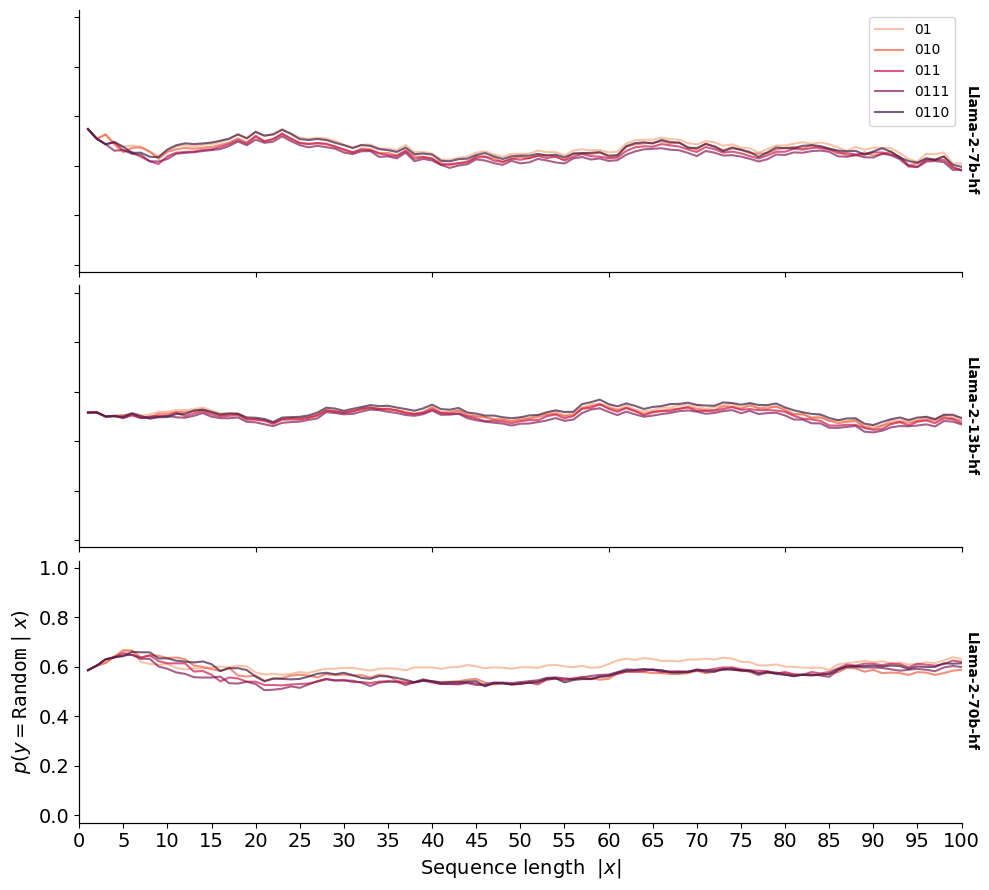

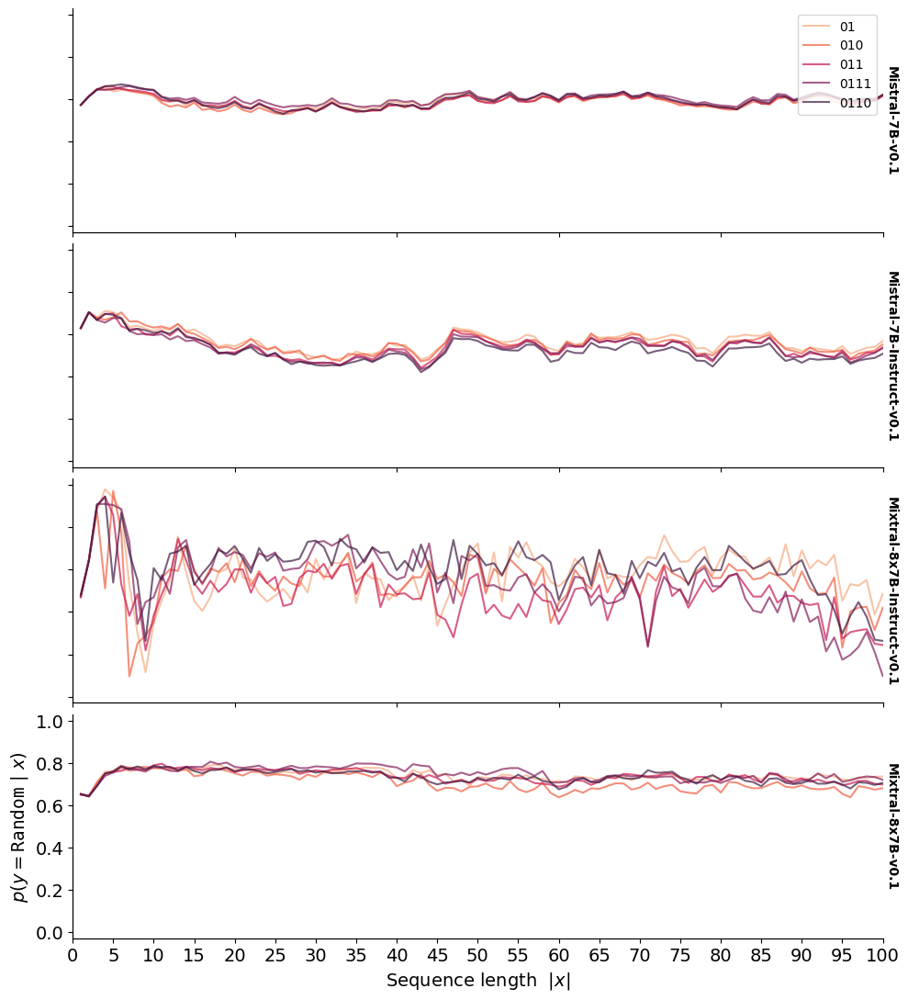

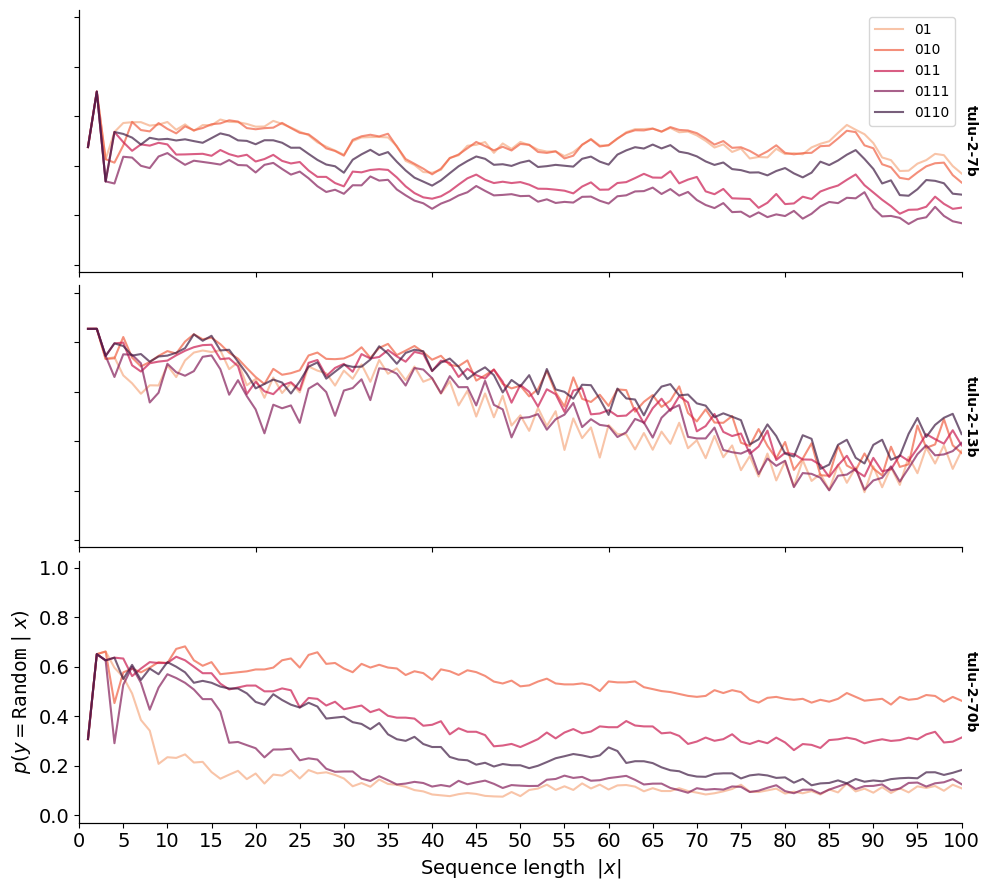

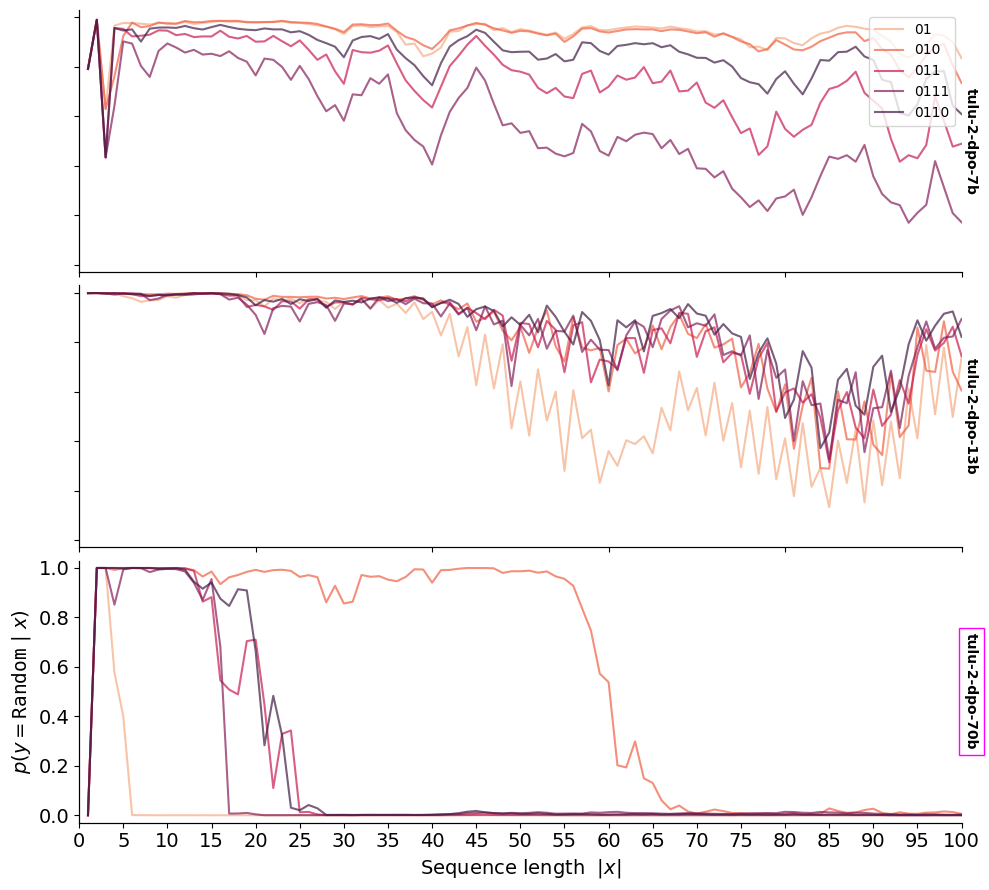

In [32]:
normalize = True
n_flips = 100


llm_groups = [
    [
        'Llama-2-7b-hf',
        'Llama-2-13b-hf',
        'Llama-2-70b-hf'
    ],
    [
        'Mistral-7B-v0.1',
        'Mistral-7B-Instruct-v0.1',
        'Mixtral-8x7B-Instruct-v0.1',
        'Mixtral-8x7B-v0.1'
    ],
    [
        'tulu-2-7b',
        'tulu-2-13b',
        'tulu-2-70b',
    ], 
    [
        'tulu-2-dpo-7b',
        'tulu-2-dpo-13b',
        'tulu-2-dpo-70b'
    ]
]

for lg_i, lg in enumerate(llm_groups):
    plt.rcParams['figure.figsize'] = (10, 3 + len(lg) * 2)
    fig, axs = plt.subplots(len(lg), 1)
    for model_id_, ax in zip(lg, axs):

        rows = []
    
        for concept in sorted(model_prob_vals[model_id_].keys(), key=lambda x: len(x)):
            if not len(concept) <= 4:
            # if not len(concept) >= 8:
            # if not 4 < len(concept) < 7:
                continue
            # --------------------------------
        
            probs_vals = model_prob_vals[model_id_][concept]
            probs_text = model_prob_texts[model_id_][concept]
    
            non_probs  = select_probs(probs_vals, probs_text, 'n')
            rand_probs = select_probs(probs_vals, probs_text, 'r')
            if normalize:
                Z = rand_probs + non_probs
                rand_probs /= Z
                non_probs /= Z
                
            x = list(range(1, n_flips+1))
            y = rand_probs
            con_str = ''.join([str(i) for i in concept])
            rows += [{'len_x': x_, 'p_random': y_, 'concept': con_str} for x_, y_ in zip(x, y)]
            
        xl_df = pd.DataFrame(rows)
        sns.lineplot(ax=ax, data=xl_df, x="len_x", y="p_random", hue='concept', 
                     alpha=.7, palette=sns.color_palette('rocket_r', n_colors=len(set(xl_df.concept))))
    

        ##########################################################################################

        ax.set_xlabel(None)
        twin = ax.twinx()
        twin.set_ylabel(model_id_, rotation=-90, labelpad=12, weight='bold')

        if model_id_ == 'tulu-2-dpo-70b':
            label = twin.yaxis.get_label()
            label.set_bbox(dict(facecolor='none', edgecolor='magenta'))
        
        twin.set_yticks([])
        twin.tick_params(labelright='off')
        if ax != axs[0]:
            ax.get_legend().remove()
        else:
            ax.legend(loc='upper right')
        ax.set_ylim(-.03, 1.03)
        ax.set_xlim(0, 100)
            
    
    sns.despine(right=True, top=True)
    
    axs[0].set_xticklabels([])
    axs[1].set_xticklabels([])
    # axs[2].set_xticklabels([])
    axs[-2].set_xticklabels([])
    axs[0].set_yticklabels([])
    axs[1].set_yticklabels([])
    # axs[2].set_yticklabels([])
    axs[-2].set_yticklabels([])
    axs[0].set_yticks([0, .2, .4, .6, .8, 1.])
    axs[1].set_yticks([0, .2, .4, .6, .8, 1.])
    axs[2].set_yticks([0, .2, .4, .6, .8, 1.])
    axs[-2].set_yticks([0, .2, .4, .6, .8, 1.])
    axs[-1].set_yticks([0, .2, .4, .6, .8, 1.])
    axs[0].set_ylabel(None)
    axs[1].set_ylabel(None)
    axs[-2].set_ylabel(None)
    axs[-1].set_ylabel('Running Avg. of Generated Flips')
    axs[-1].set_xlabel('Output Index i for $y_i$')

    axs[-1].set_ylabel('$p(y = \mathtt{Random} \ | \  x)$', fontsize=14)
    axs[-1].set_xlabel('Sequence length  $|x|$', fontsize=14)
    axs[-1].tick_params(axis='both', which='major', labelsize=14)
    
    plt.tight_layout()
    plt.subplots_adjust(hspace=.05)
    
        
    plt.xticks(list(range(0, n_flips+1, n_flips//20)))

    plt.savefig(f'imgs/fig_judge-hf_small_lg{lg_i}.pdf')
    plt.show()

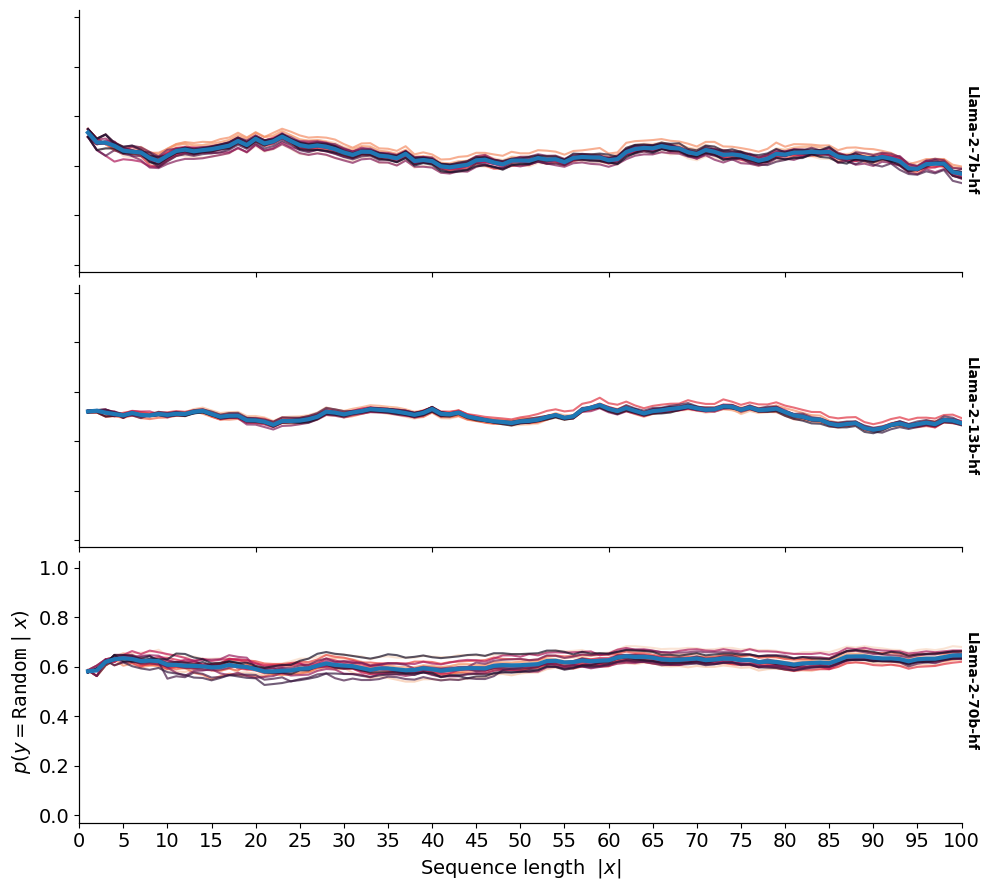

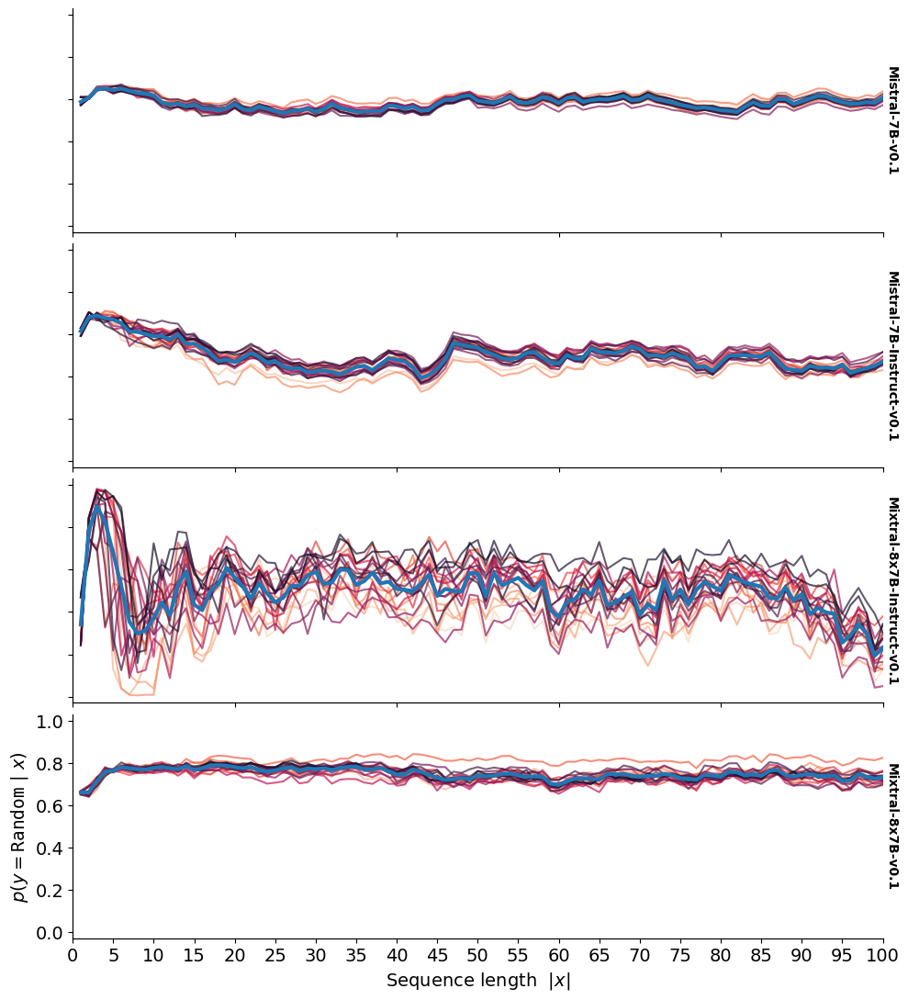

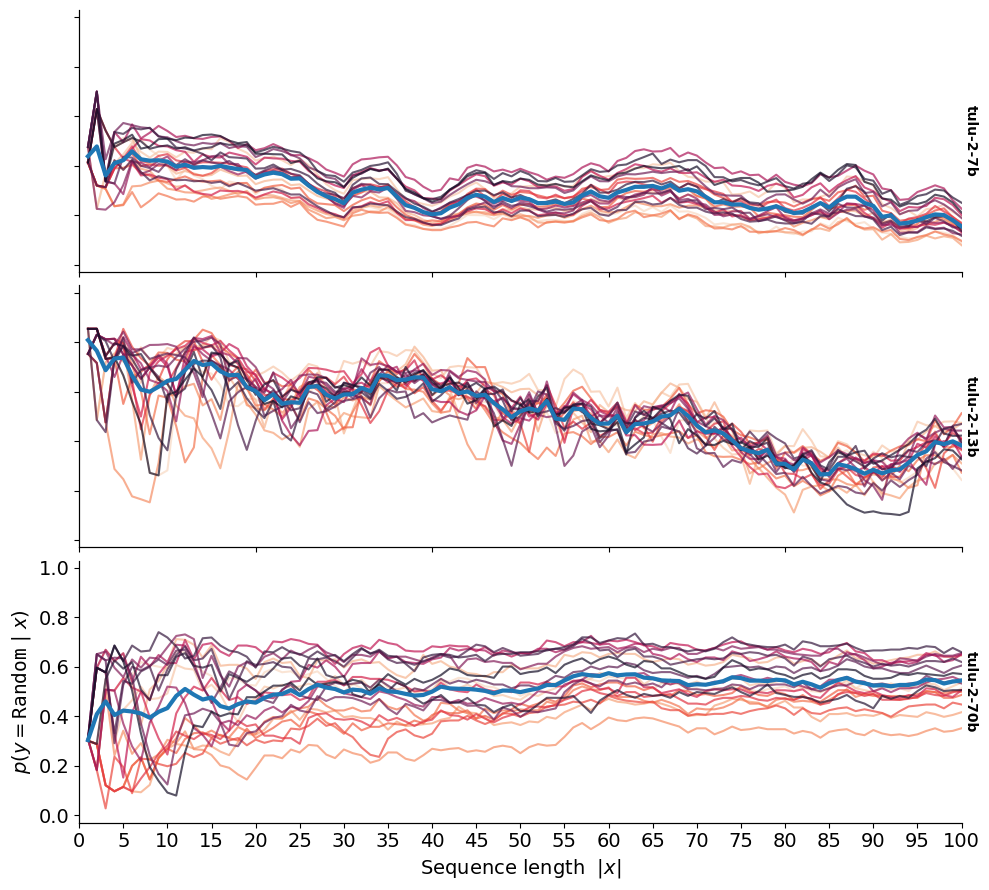

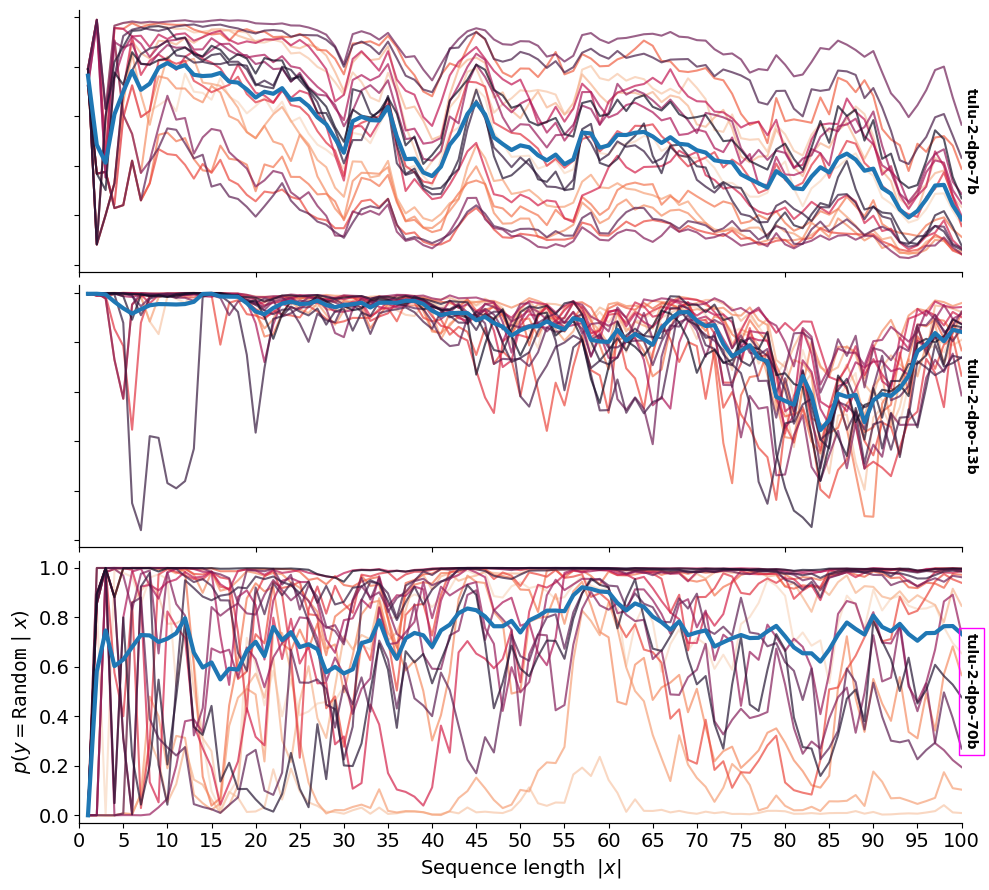

In [38]:
normalize = True
n_flips = 100


llm_groups = [
    [
        'Llama-2-7b-hf',
        'Llama-2-13b-hf',
        'Llama-2-70b-hf'
    ],
    [
        'Mistral-7B-v0.1',
        'Mistral-7B-Instruct-v0.1',
        'Mixtral-8x7B-Instruct-v0.1',
        'Mixtral-8x7B-v0.1'
    ],
    [
        'tulu-2-7b',
        'tulu-2-13b',
        'tulu-2-70b',
    ], 
    [
        'tulu-2-dpo-7b',
        'tulu-2-dpo-13b',
        'tulu-2-dpo-70b'
    ]
]

for lg_i, lg in enumerate(llm_groups):
    plt.rcParams['figure.figsize'] = (10, 3 + len(lg) * 2)
    fig, axs = plt.subplots(len(lg), 1)
    for model_id_, ax in zip(lg, axs):

        rows = []
    
        for concept in list(rand_prob_vals[model_id_].keys())[:20]:
            # if not len(concept) <= 4:
            # if not len(concept) >= 8:
            # if not 4 < len(concept) < 7:
            # --------------------------------
        
            probs_vals = rand_prob_vals[model_id_][concept]
            probs_text = rand_prob_texts[model_id_][concept]
    
            non_probs  = select_probs(probs_vals, probs_text, 'n')
            rand_probs = select_probs(probs_vals, probs_text, 'r')
            if normalize:
                Z = rand_probs + non_probs
                rand_probs /= Z
                non_probs /= Z
                
            x = list(range(1, n_flips+1))
            y = rand_probs
            con_str = ''.join([str(i) for i in concept])
            rows += [{'len_x': x_, 'p_random': y_, 'concept': con_str} for x_, y_ in zip(x, y)]
            
        xl_df = pd.DataFrame(rows)
        sns.lineplot(ax=ax, data=xl_df, x="len_x", y="p_random", hue='concept', 
                     alpha=.7, palette=sns.color_palette('rocket_r', n_colors=len(set(xl_df.concept))))
        sns.lineplot(ax=ax, data=xl_df, x="len_x", y="p_random", lw=3,
                     alpha=1, color=sns.color_palette()[0], errorbar=None)
    

        ##########################################################################################

        ax.set_xlabel(None)
        twin = ax.twinx()
        twin.set_ylabel(model_id_, rotation=-90, labelpad=12, weight='bold')

        if model_id_ == 'tulu-2-dpo-70b':
            label = twin.yaxis.get_label()
            label.set_bbox(dict(facecolor='none', edgecolor='magenta'))
        
        twin.set_yticks([])
        twin.tick_params(labelright='off')
        # if ax != axs[0]:
        ax.get_legend().remove()
        # else:
        #     ax.legend(loc='upper right')
        ax.set_ylim(-.03, 1.03)
        ax.set_xlim(0, 100)
            
    
    sns.despine(right=True, top=True)
    
    axs[0].set_xticklabels([])
    axs[1].set_xticklabels([])
    # axs[2].set_xticklabels([])
    axs[-2].set_xticklabels([])
    axs[0].set_yticklabels([])
    axs[1].set_yticklabels([])
    # axs[2].set_yticklabels([])
    axs[-2].set_yticklabels([])
    axs[0].set_yticks([0, .2, .4, .6, .8, 1.])
    axs[1].set_yticks([0, .2, .4, .6, .8, 1.])
    axs[2].set_yticks([0, .2, .4, .6, .8, 1.])
    axs[-2].set_yticks([0, .2, .4, .6, .8, 1.])
    axs[-1].set_yticks([0, .2, .4, .6, .8, 1.])
    axs[0].set_ylabel(None)
    axs[1].set_ylabel(None)
    axs[-2].set_ylabel(None)
    axs[-1].set_ylabel('Running Avg. of Generated Flips')
    axs[-1].set_xlabel('Output Index i for $y_i$')

    axs[-1].set_ylabel('$p(y = \mathtt{Random} \ | \  x)$', fontsize=14)
    axs[-1].set_xlabel('Sequence length  $|x|$', fontsize=14)
    axs[-1].tick_params(axis='both', which='major', labelsize=14)
    
    plt.tight_layout()
    plt.subplots_adjust(hspace=.05)
    
        
    plt.xticks(list(range(0, n_flips+1, n_flips//20)))

    plt.savefig(f'imgs/fig_judge-hf_rand_lg{lg_i}.pdf')
    plt.show()

<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>


# Generation

In [18]:
from utils import make_flips_row, get_results, compute_running_prob

In [69]:
def flips_to_binary(flip_text_mat):
    n_samples, x_len = flip_text_mat.shape
    xs = []
    
    for s in np.apply_along_axis(''.join, -1, flip_text_mat):
        flips = np.array([flip[0] for flip in s.lower().split(',') if len(flip) > 0])
        x = -np.ones_like(flips, dtype=float)
        x += (flips == 'h')
        x += (flips == 't') * 2
        x[x == -1] = np.nan
        xs.append(x)

    return xs

In [66]:
model_seqs = {}

for model_id in tqdm(model_ids):
    tokenizer = tokenizers[model_id]
    model_id_ = model_id.split('/')[1]
    model_dir = f'data/hf/gen_{model_id_}'
    

    # Aggregate all batched filenames for each p(Tails)
    gen_files = defaultdict(list)
    for f in os.listdir(model_dir):
        if 'seqs_idx' in f:
            p_tails = int(f.split('_')[0][5:])
            gen_files[p_tails].append(f'{model_dir}/{f}')

    gen_idxs  = {p_tails: load_mats(files) for p_tails, files in gen_files.items()}
    gen_texts = {p_tails: decode_3d(X, tokenizer)    for p_tails, X in gen_idxs.items()}
    
    model_seqs[model_id_] = gen_texts

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [02:13<00:00, 10.30s/it]


  0%|                                                                                                                     | 0/13 [00:00<?, ?it/s]

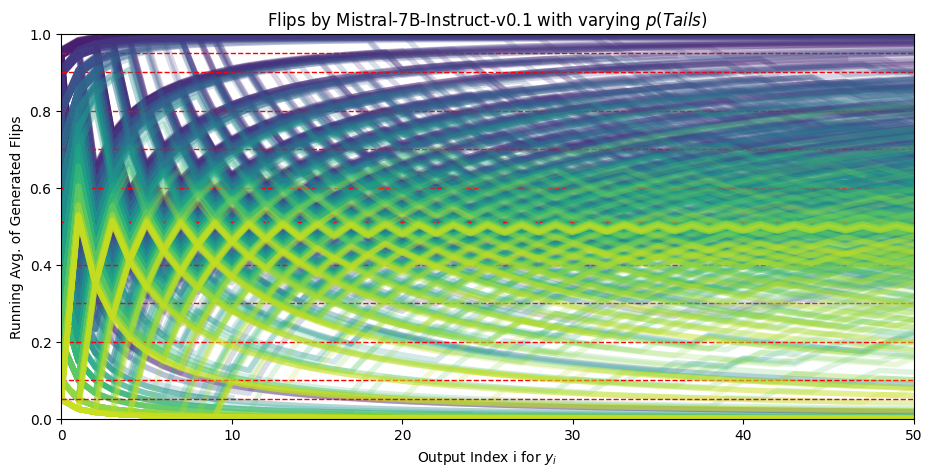

 15%|████████████████▊                                                                                            | 2/13 [00:16<01:28,  8.00s/it]

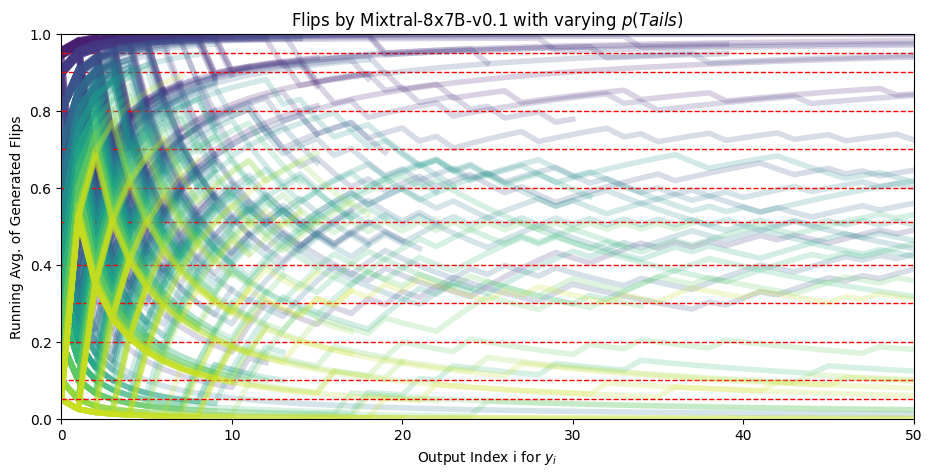

 23%|█████████████████████████▏                                                                                   | 3/13 [00:31<01:49, 10.94s/it]

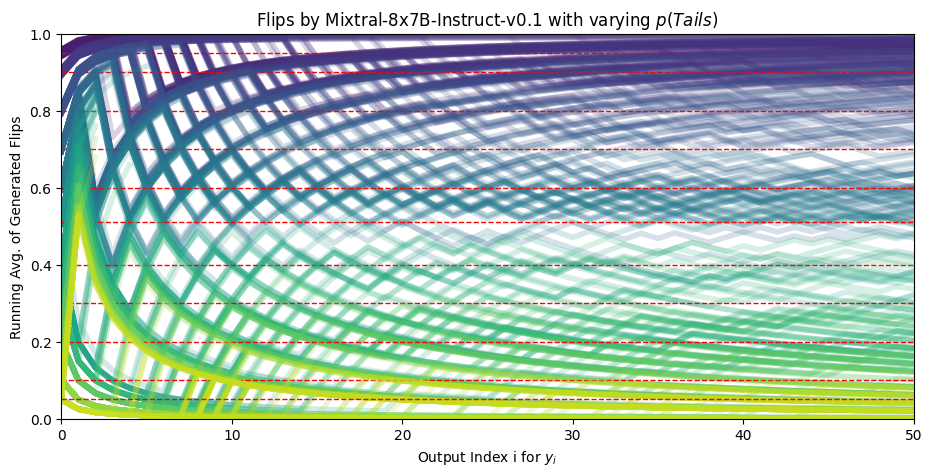

 31%|█████████████████████████████████▌                                                                           | 4/13 [00:47<01:56, 12.90s/it]

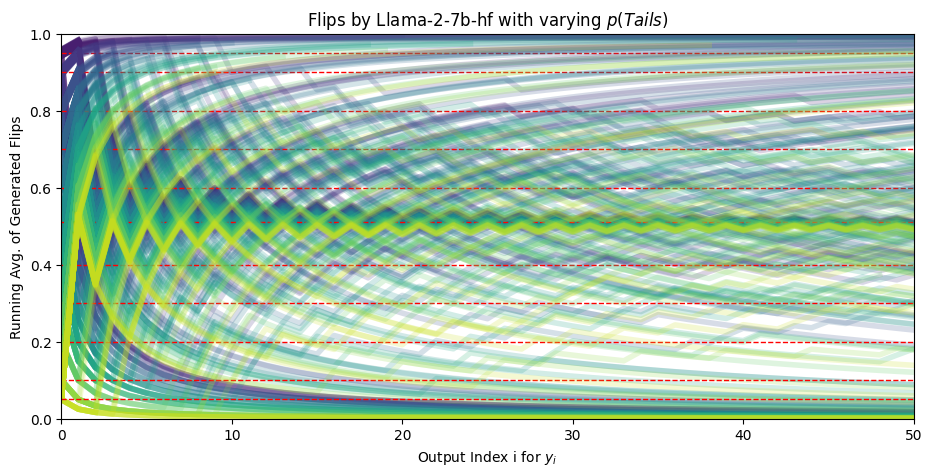

 38%|█████████████████████████████████████████▉                                                                   | 5/13 [01:02<01:48, 13.58s/it]

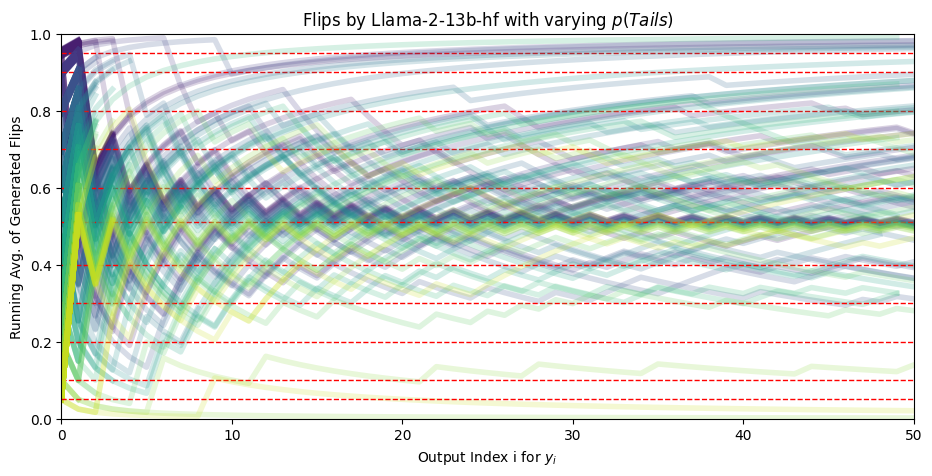

 46%|██████████████████████████████████████████████████▎                                                          | 6/13 [01:18<01:40, 14.39s/it]

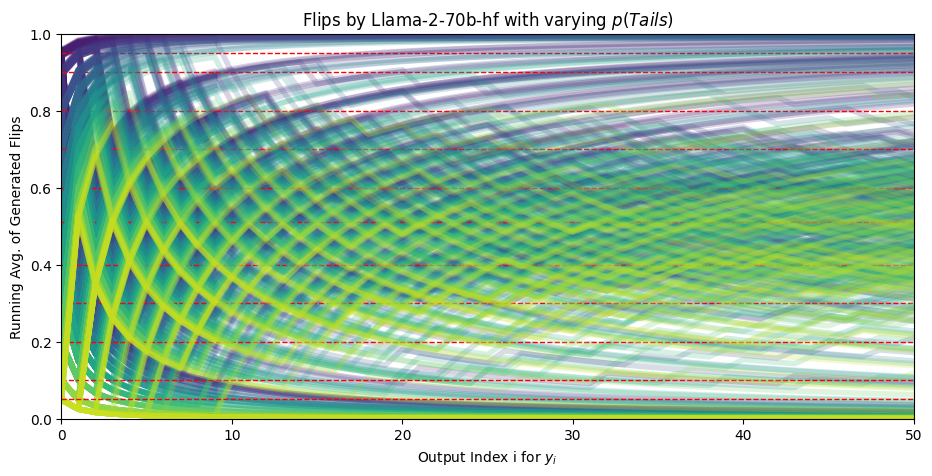

 54%|██████████████████████████████████████████████████████████▋                                                  | 7/13 [01:35<01:32, 15.35s/it]

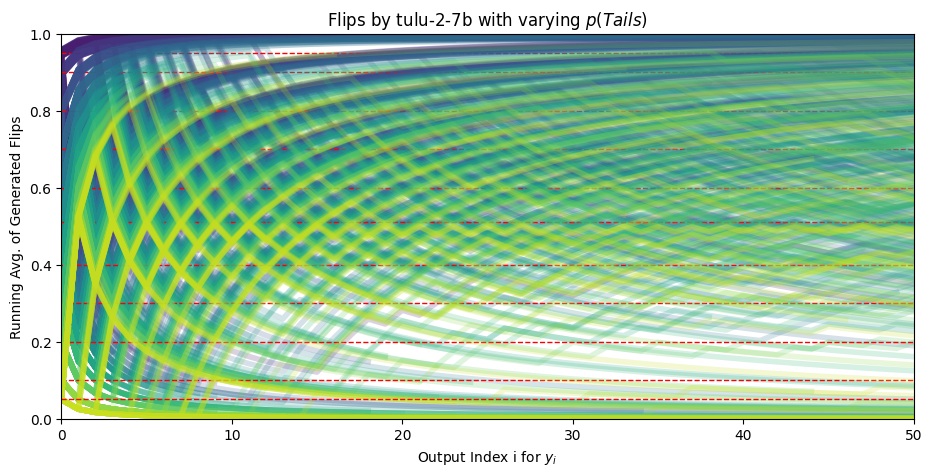

 62%|███████████████████████████████████████████████████████████████████                                          | 8/13 [01:50<01:16, 15.27s/it]

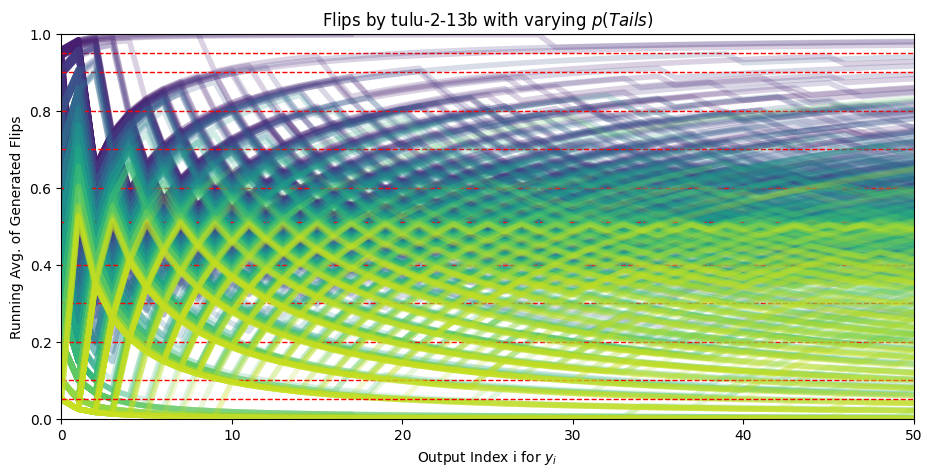

 69%|███████████████████████████████████████████████████████████████████████████▍                                 | 9/13 [02:05<01:01, 15.29s/it]

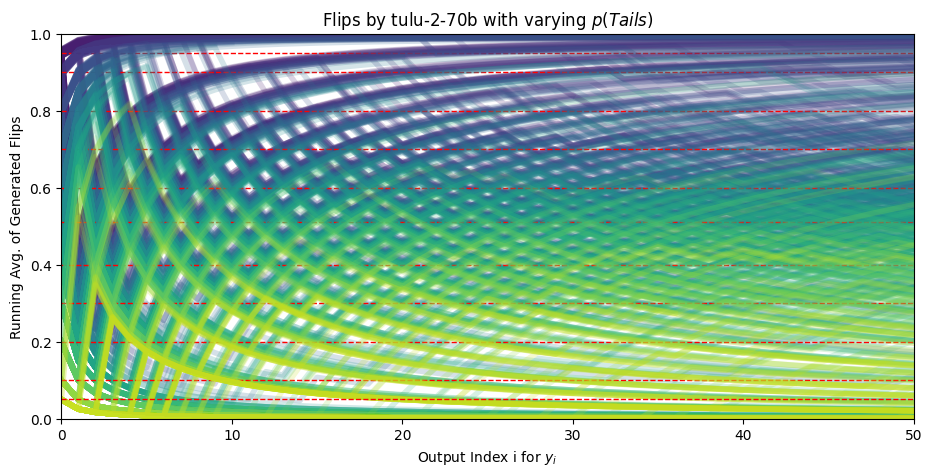

 77%|███████████████████████████████████████████████████████████████████████████████████                         | 10/13 [02:23<00:48, 16.07s/it]

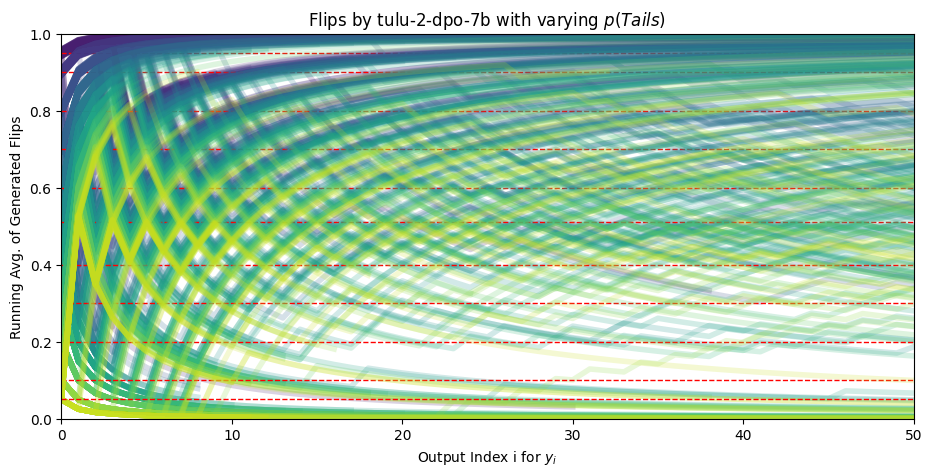

 85%|███████████████████████████████████████████████████████████████████████████████████████████▍                | 11/13 [02:39<00:32, 16.07s/it]

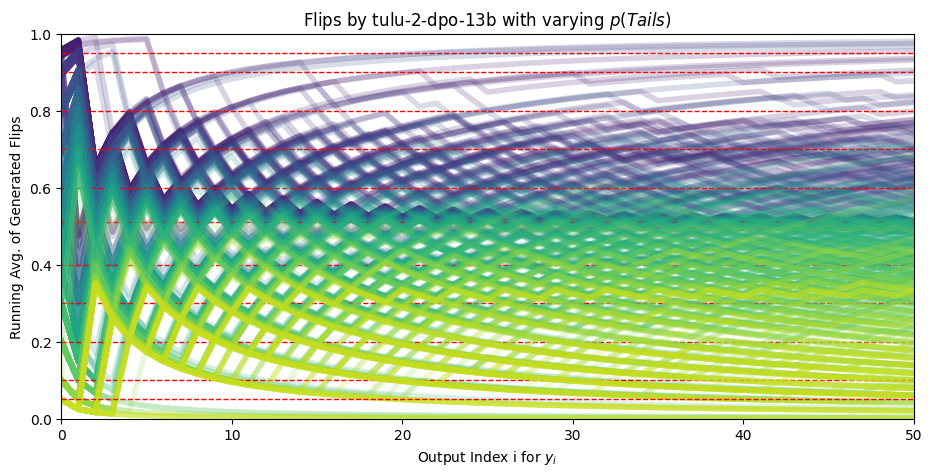

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▋        | 12/13 [02:57<00:16, 16.44s/it]

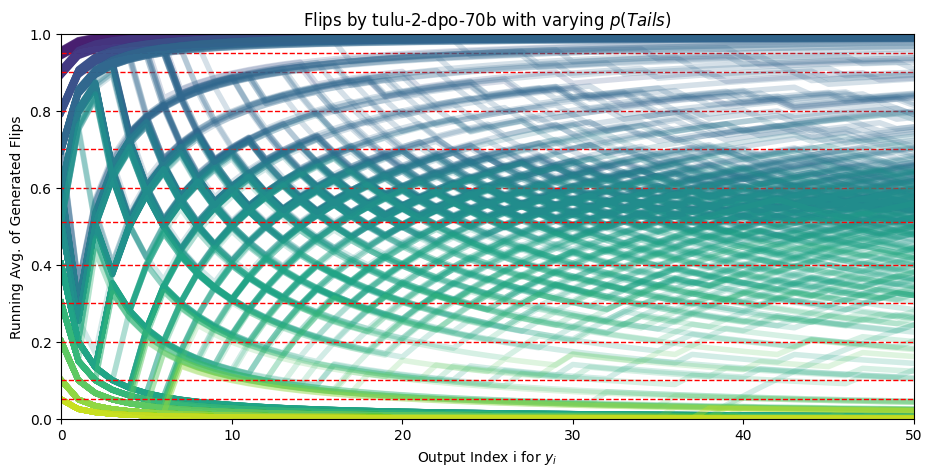

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [03:12<00:00, 14.85s/it]


In [76]:
plt.rcParams['figure.figsize'] = (11, 5)

seq_len = 50


for model_id_ in tqdm(model_seqs.keys()):
    if 'Mistral-7B-v0.1' in model_id_:
        continue
    
    p_heads_ls = [5, 10, 20, 30, 40, 49, 60, 70, 80, 90, 95]
    
    for i, p_heads in enumerate(p_heads_ls):
        goal_p = round(1 - (p_heads / 100), 2)
        p_tails = 100 - p_heads
        
        flips_ls = model_seqs[model_id_][p_tails][0]
        flips_mat = flips_to_binary(flips_ls)

        for flips in flips_mat:
            y = compute_running_prob(flips, goal_p)
            
            jit = .01
            y *= (1 + np.random.uniform(-jit, jit))    # jitter
            
            color = sns.color_palette("viridis", n_colors=len(p_heads_ls))[i]
            sns.lineplot(x=range(len(y)), y=y, alpha=.2, linewidth=4, color=color)  #, clip_on=False)
            
        plt.hlines(goal_p, 0, seq_len, linestyles='--', color='red', linewidth=1)
    
    plt.xlim(0, 50);
    plt.ylim(0, 1)
    plt.xlabel('Output Index i for $y_i$')
    plt.ylabel('Running Avg. of Generated Flips')
    plt.title(f'Flips by {model_id_} with varying $p(Tails)$')
    
    plt.savefig(f'imgs/fig_avgs-{model_id_}-all.pdf')
    plt.show()

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:40<00:00, 13.39s/it]


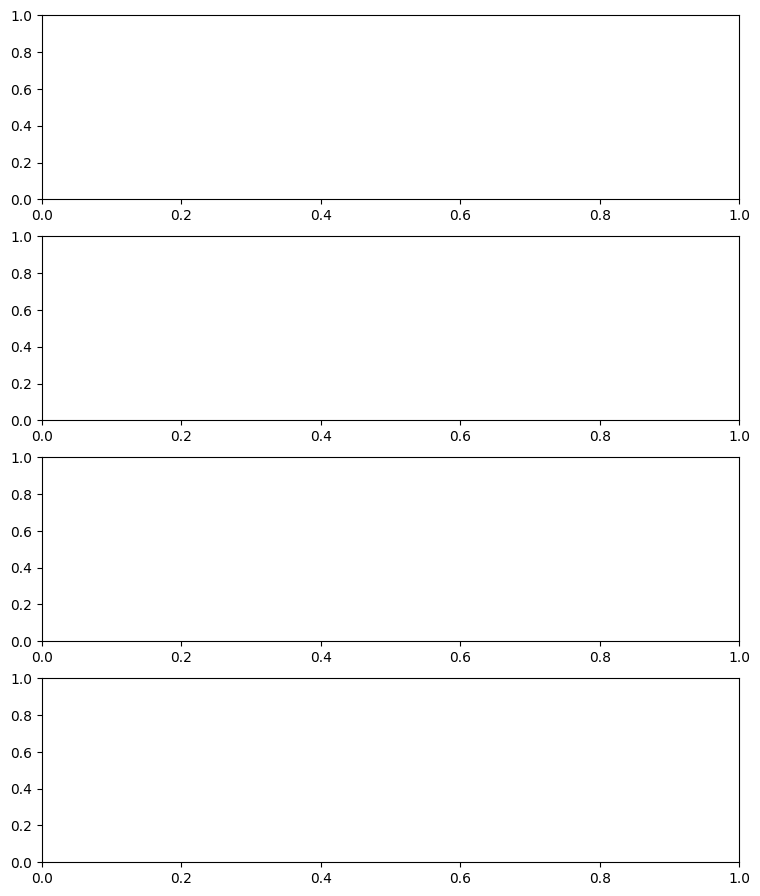

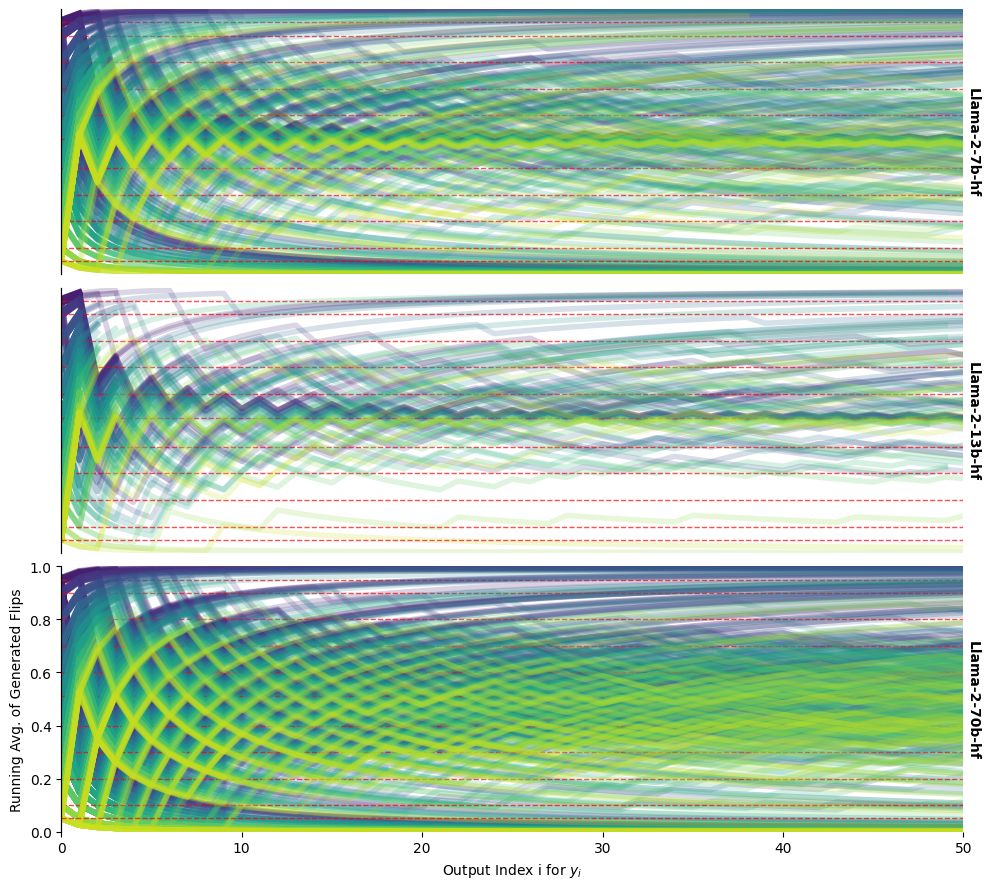

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:39<00:00, 13.02s/it]


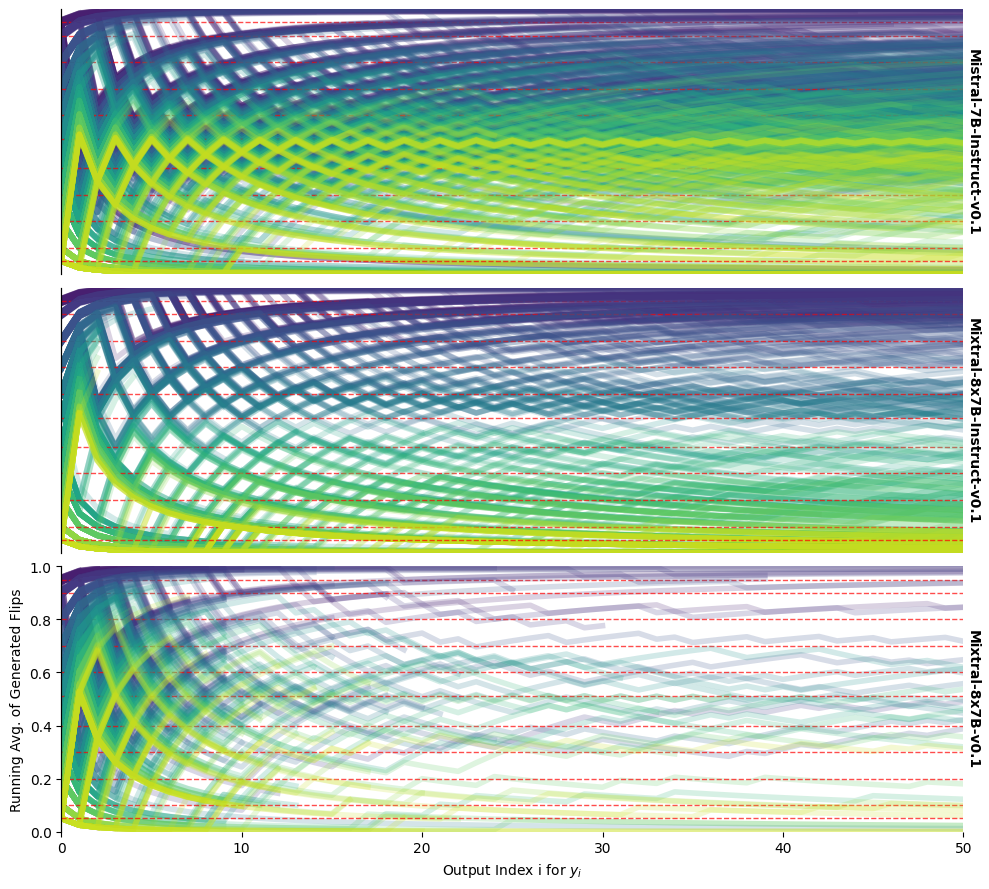

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:40<00:00, 13.57s/it]


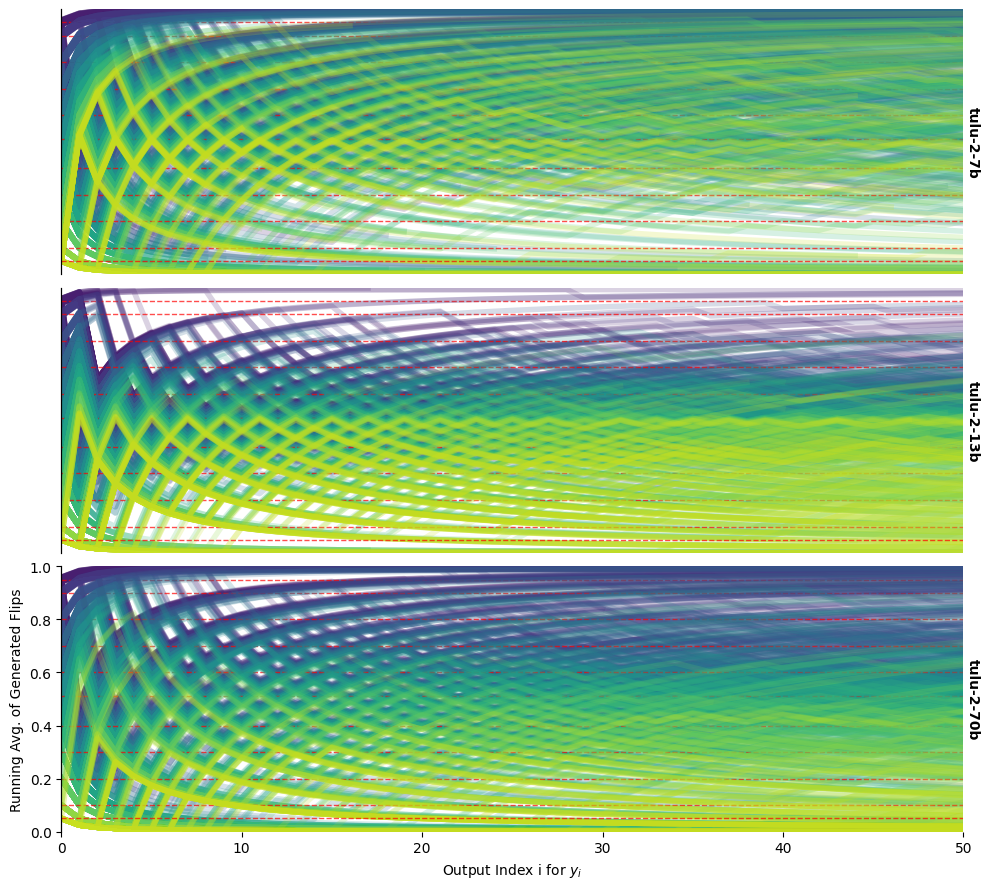

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:40<00:00, 13.55s/it]


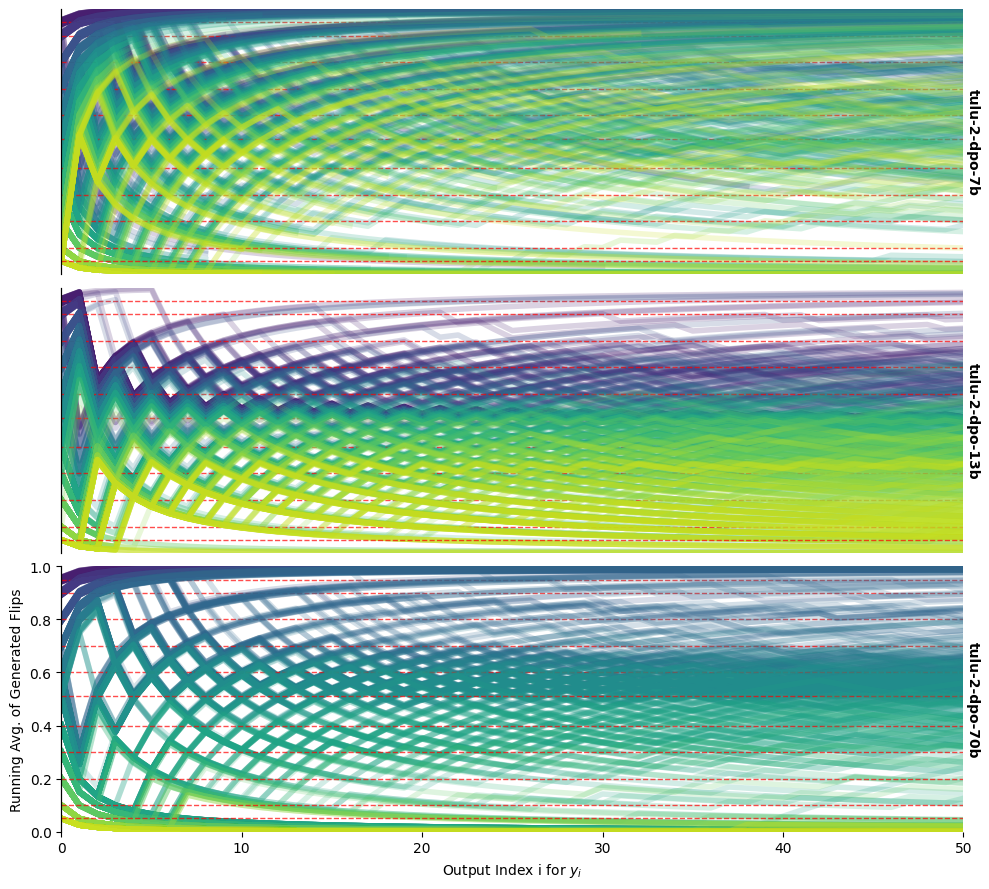

In [165]:
plt.rcParams['figure.figsize'] = (9, 11)
seq_len = 50
cap_n_flips = 50

fig, axs = plt.subplots(4, 1)



for lg_i, lg in enumerate(llm_groups):
    lg = [m for m in lg if 'Mistral-7B-v0.1' not in m]
    
    plt.rcParams['figure.figsize'] = (10, 3 + len(lg) * 2)
    fig, axs = plt.subplots(len(lg), 1)
    for model_id_, ax in tqdm(list(  zip(lg, axs))  ):
        
        p_heads_ls = [5, 10, 20, 30, 40, 49, 60, 70, 80, 90, 95]
        
        for i, p_heads in enumerate(p_heads_ls):
            goal_p = round(1 - (p_heads / 100), 2)
            p_tails = 100 - p_heads
            
            flips_ls = model_seqs[model_id_][p_tails][0]
            flips_mat = flips_to_binary(flips_ls)
    
            for flips in flips_mat:
                y = compute_running_prob(flips, goal_p)
                
                jit = .01
                y *= (1 + np.random.uniform(-jit, jit))    # jitter
                
                color = sns.color_palette("viridis", n_colors=len(p_heads_ls))[i]
                sns.lineplot(ax=ax, x=range(len(y)), y=y, alpha=.2, linewidth=4, color=color)  #, clip_on=False)
                
            ax.hlines(goal_p, 0, seq_len, linestyles='--', color='red', linewidth=1, alpha=.7)
    
        ax.set_ylim(0, 1)
        ax.set_xlim(0, seq_len);
        
        # ax.hlines(goal_p, 0, seq_len, linestyles='--', color='red', linewidth=2)
        twin = ax.twinx()
        twin.set_ylabel(model_id_, rotation=-90, labelpad=12, weight='bold')
        twin.set_yticks([])
        twin.tick_params(labelright='off')
    
    sns.despine(bottom=True, left=False, right=True, top=True)

    for ax in axs[:-1]:
        ax.set_xticks([])
        ax.set_yticks([])
    
    axs[-1].set_ylabel('Running Avg. of Generated Flips')
    axs[-1].set_xlabel('Output Index i for $y_i$')
    plt.tight_layout()
    plt.subplots_adjust(hspace=.05)
    
    plt.savefig(f'imgs/fig_avgs-hf_lg{lg_i}.pdf')
    plt.show()

### model bias

In [96]:
gen_dfs = []

for model_id_ in tqdm(model_seqs.keys()):
    # if 'Mistral' in model_id_:
    #     continue
    p_heads_ls = [5, 10, 20, 30, 40, 49, 60, 70, 80, 90, 95]
    for i, p_heads in enumerate(p_heads_ls):
        p_tails = 100 - p_heads
        flip_arr = flips_to_binary(model_seqs[model_id_][p_tails][0])
        flip_arr = [np.array([x for x in X if not np.isnan(x)]) for X in flip_arr]

        gen_df = get_results(model_id_, p_tails, flip_arr, {}, seq_len=50, n_samples=None)
        gen_dfs.append(gen_df)

gen_dff = pd.concat(gen_dfs)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:04<00:00,  2.66it/s]


In [149]:
model_ids = list(set(gen_dff.llm))

llama_ids = [m for m in model_ids if 'lama' in m]
mistr_ids = [m for m in model_ids if 'tral' in m]
tulu_ids = [m for m in model_ids if 'tulu-2' in m and 'dpo' not in m]
dpo_ids = [m for m in model_ids if 'dpo' in m]

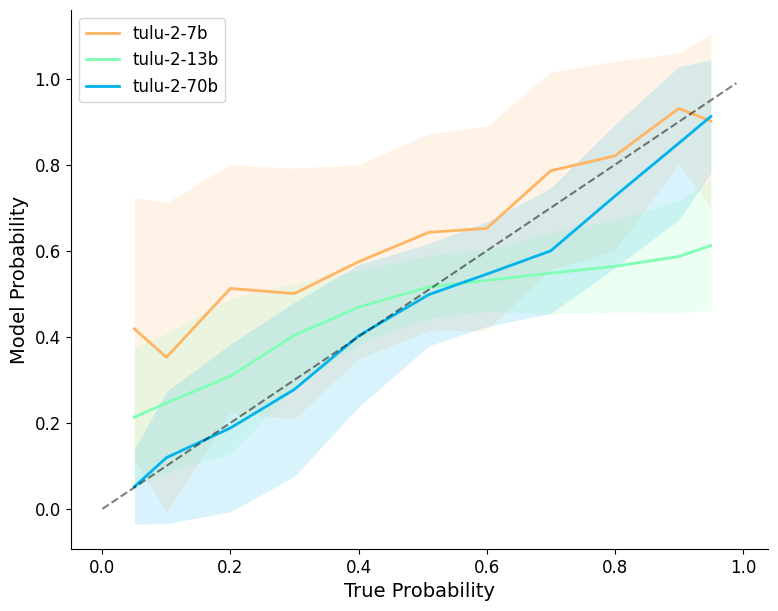

In [166]:
plt.rcParams['figure.figsize'] = (9, 7)

sns.lineplot(
    data=gen_dff[gen_dff.llm.isin(tulu_ids)], x="goal_p", y="mean", hue="llm", lw=2,
    errorbar=("sd", 1), err_kws={'alpha': .15, 'lw': 0},
    palette=sns.color_palette('rainbow_r', n_colors=len(tulu_ids))
    
)
xr = np.arange(0, 1, .01)
plt.plot(xr, xr, ls='--', color='black', alpha=.5)


plt.xlabel('True Probability', fontsize=14)
plt.ylabel('Model Probability', fontsize=14)
plt.gca().tick_params(axis='both', which='major', labelsize=12)
plt.legend(fontsize=12)

sns.despine()
plt.savefig('imgs/fig_llms-means_hf-tulu.pdf')
plt.show()

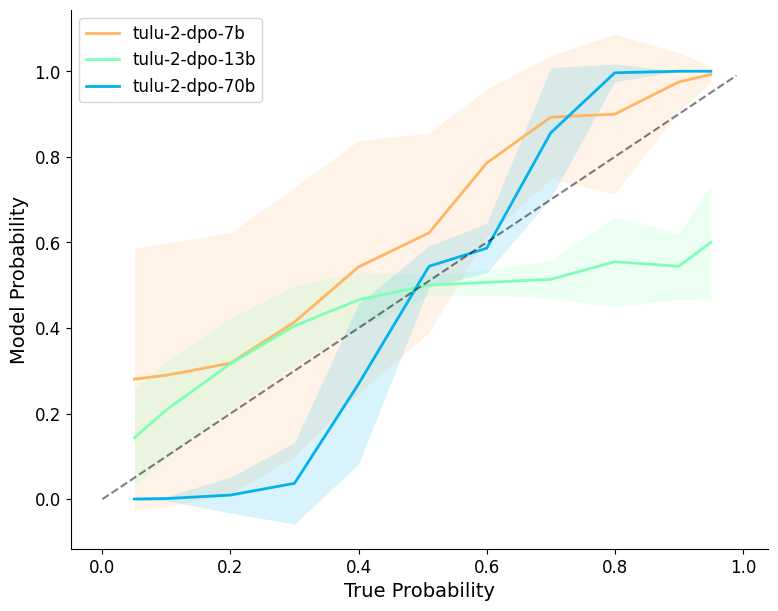

In [167]:
plt.rcParams['figure.figsize'] = (9, 7)

sns.lineplot(
    data=gen_dff[gen_dff.llm.isin(dpo_ids)], x="goal_p", y="mean", hue="llm", lw=2,
    errorbar=("sd", 1), err_kws={'alpha': .15, 'lw': 0},
    palette=sns.color_palette('rainbow_r', n_colors=len(dpo_ids))
    
)
xr = np.arange(0, 1, .01)
plt.plot(xr, xr, ls='--', color='black', alpha=.5)


plt.xlabel('True Probability', fontsize=14)
plt.ylabel('Model Probability', fontsize=14)
plt.gca().tick_params(axis='both', which='major', labelsize=12)
plt.legend(fontsize=12)

sns.despine()
plt.savefig('imgs/fig_llms-means_hf-tulu_dpo.pdf')
plt.show()

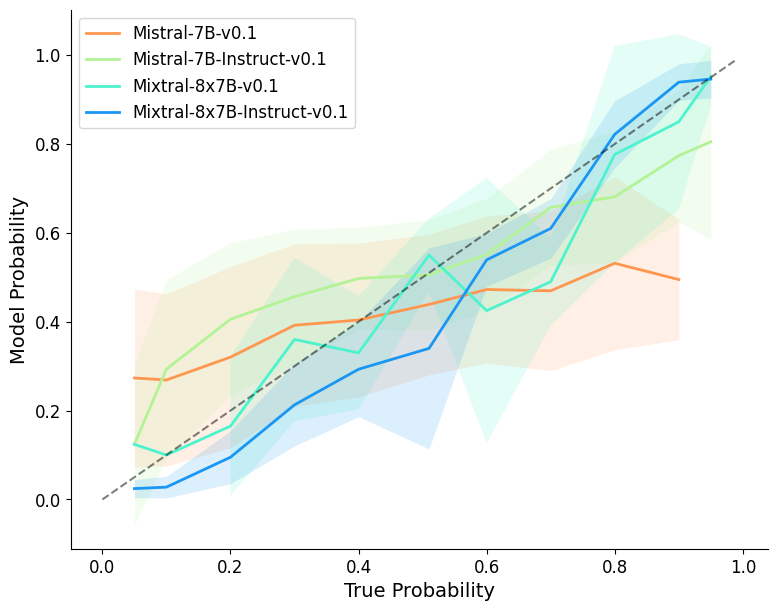

In [168]:
plt.rcParams['figure.figsize'] = (9, 7)

sns.lineplot(
    data=gen_dff[gen_dff.llm.isin(mistr_ids)], x="goal_p", y="mean", hue="llm", lw=2,
    errorbar=("sd", 1), err_kws={'alpha': .15, 'lw': 0},
    palette=sns.color_palette('rainbow_r', n_colors=len(mistr_ids))
    
)
xr = np.arange(0, 1, .01)
plt.plot(xr, xr, ls='--', color='black', alpha=.5)


plt.xlabel('True Probability', fontsize=14)
plt.ylabel('Model Probability', fontsize=14)
plt.gca().tick_params(axis='both', which='major', labelsize=12)
plt.legend(fontsize=12)

sns.despine()
plt.savefig('imgs/fig_llms-means_hf-mistral.pdf')
plt.show()

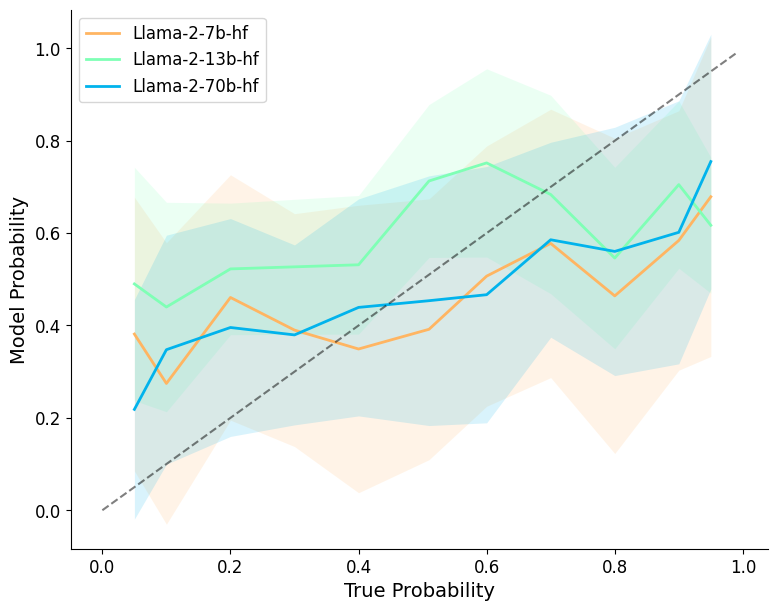

In [169]:
plt.rcParams['figure.figsize'] = (9, 7)

sns.lineplot(
    data=gen_dff[gen_dff.llm.isin(llama_ids)], x="goal_p", y="mean", hue="llm", lw=2,
    errorbar=("sd", 1), err_kws={'alpha': .15, 'lw': 0},
    palette=sns.color_palette('rainbow_r', n_colors=len(llama_ids))
    
)
xr = np.arange(0, 1, .01)
plt.plot(xr, xr, ls='--', color='black', alpha=.5)


plt.xlabel('True Probability', fontsize=14)
plt.ylabel('Model Probability', fontsize=14)
plt.gca().tick_params(axis='both', which='major', labelsize=12)
plt.legend(fontsize=12)

sns.despine()
plt.savefig('imgs/fig_llms-means_hf-llama.pdf')
plt.show()